Carregando o arquivo: data\physionet_data\S001\S001R03.edf
Dados carregados. Frequência de amostragem: 160.0 Hz.
Total de 30 anotações encontradas.

Iniciando a geração de espectrogramas para cada época...
Parâmetros da STFT: nperseg=64, noverlap=32


C:\Users\luize\AppData\Local\Temp\ipykernel_18080\3551797063.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Ajusta o layout para o título principal


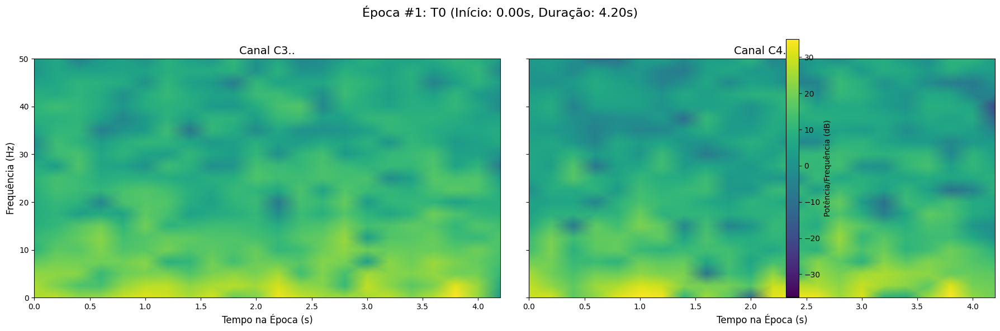

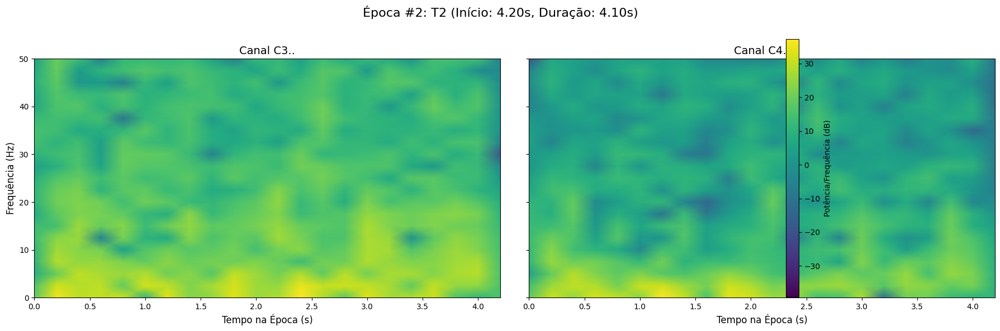

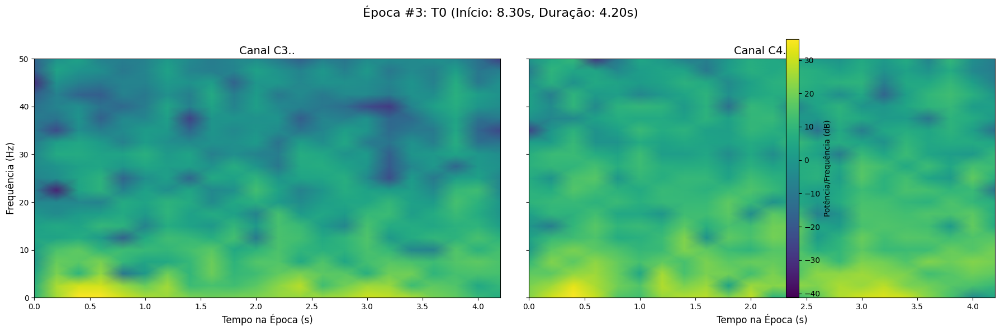

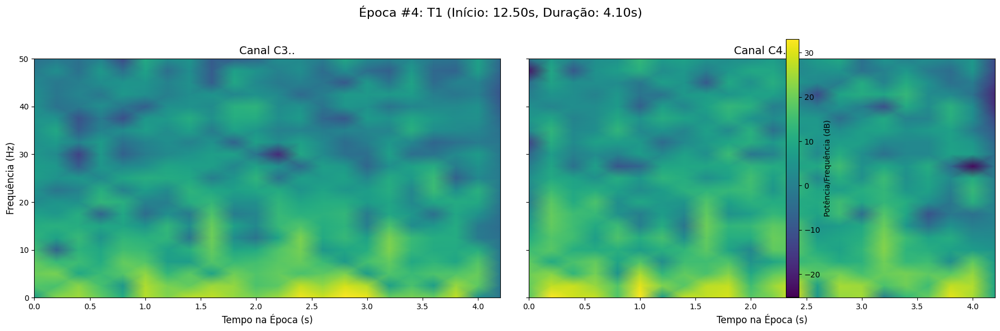

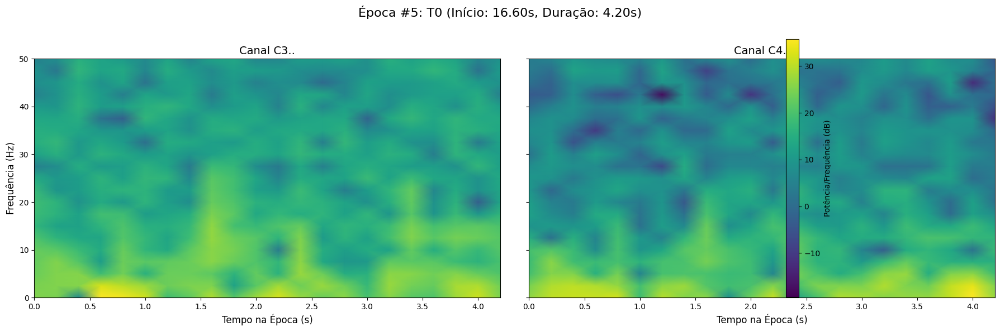

...

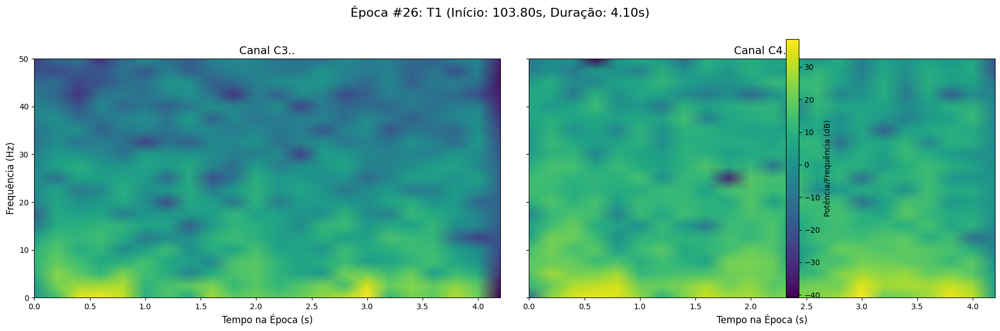

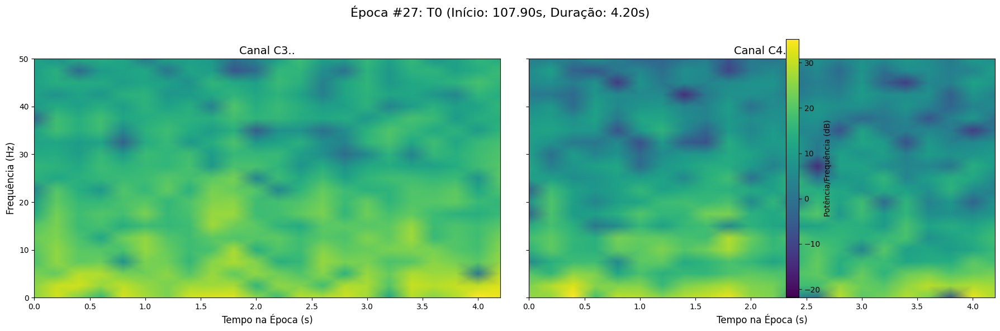

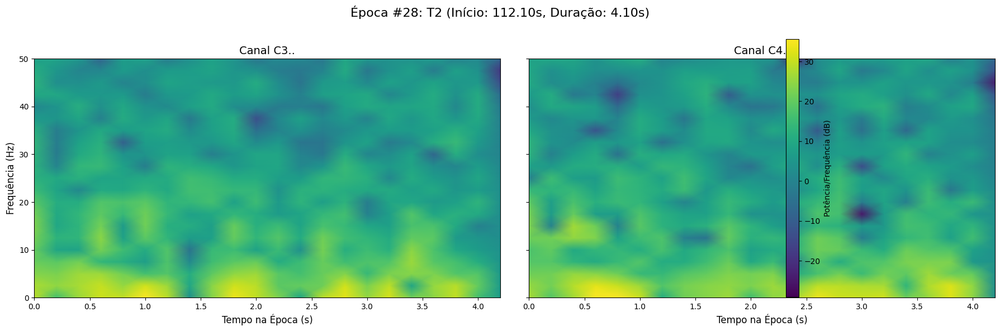

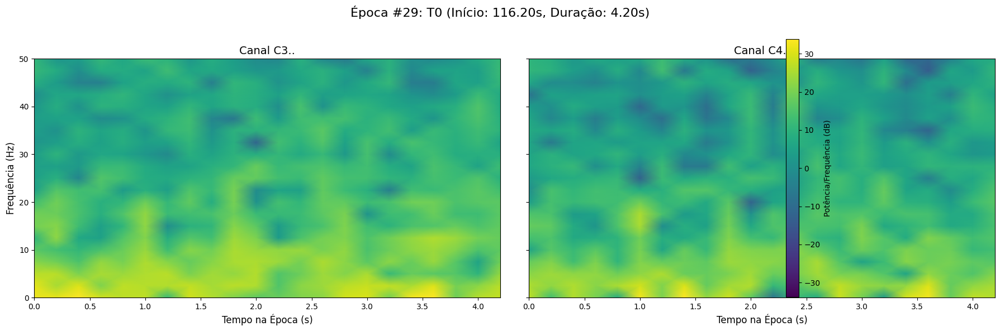

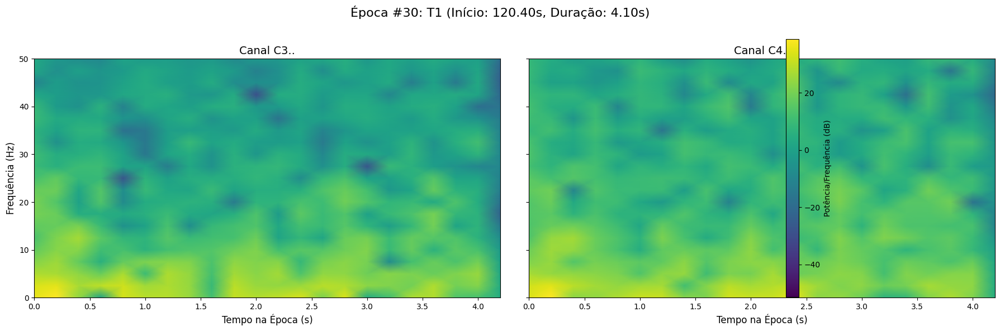


Todos os espectrogramas foram gerados.


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
from pyedflib import highlevel

# --- 1. Definição de Constantes e Parâmetros ---

FILE_PATH = os.path.join('data', 'physionet_data', 'S001', 'S001R03.edf')
WINDOW_DURATION_MS = 400  # Duração da janela em milissegundos
CHANNELS_TO_ANALYZE = ['C3..', 'C4..'] # Canais para análise conjunta

# --- 2. Carregamento e Preparação dos Dados ---

try:
    print(f"Carregando o arquivo: {FILE_PATH}")
    signals, signal_headers, header = highlevel.read_edf(FILE_PATH)
    
    # Extrai as anotações (eventos) do cabeçalho do arquivo
    annotations = header['annotations']
    
    fs = signal_headers[0]['sample_frequency']
    channel_names = [h['label'] for h in signal_headers]
    
    # Pega os índices e os dados dos canais C3 e C4
    c3_idx = channel_names.index(CHANNELS_TO_ANALYZE[0])
    c4_idx = channel_names.index(CHANNELS_TO_ANALYZE[1])
    
    signal_c3 = signals[c3_idx, :]
    signal_c4 = signals[c4_idx, :]
    
    print(f"Dados carregados. Frequência de amostragem: {fs} Hz.")
    print(f"Total de {len(annotations)} anotações encontradas.")

except FileNotFoundError:
    print(f"ERRO: O arquivo não foi encontrado em '{FILE_PATH}'.")
    exit()
except Exception as e:
    print(f"Ocorreu um erro: {e}")
    exit()

# --- 3. Cálculo da STFT e Visualização por Época ---

# Calcular parâmetros da STFT com base na duração da janela
window_duration_s = WINDOW_DURATION_MS / 1000.0
nperseg = int(window_duration_s * fs)
noverlap = nperseg // 2 # Sobreposição de 50% é um bom padrão

print("\nIniciando a geração de espectrogramas para cada época...")
print(f"Parâmetros da STFT: nperseg={nperseg}, noverlap={noverlap}")

# Loop para cada anotação (época) encontrada no arquivo
for i, (onset, duration, description) in enumerate(annotations):
    
    # Converter tempo em segundos para amostras
    start_sample = int(onset * fs)
    end_sample = int((onset + duration) * fs)
    
    # Garantir que a época está dentro dos limites do sinal
    if end_sample > len(signal_c3):
        continue
        
    # Isolar os dados da época para cada canal
    epoch_c3 = signal_c3[start_sample:end_sample]
    epoch_c4 = signal_c4[start_sample:end_sample]
    
    # Aplicar a STFT a cada época isolada
    f_c3, t_c3, Zxx_c3 = stft(epoch_c3, fs=fs, nperseg=nperseg, noverlap=noverlap)
    f_c4, t_c4, Zxx_c4 = stft(epoch_c4, fs=fs, nperseg=nperseg, noverlap=noverlap)
    
    # Converter para decibéis para melhor visualização
    Zxx_db_c3 = 20 * np.log10(np.abs(Zxx_c3) + 1e-9)
    Zxx_db_c4 = 20 * np.log10(np.abs(Zxx_c4) + 1e-9)
    
    # --- Plotagem ---
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6), sharey=True)
    
    # Título principal para a figura, descrevendo a época
    fig.suptitle(f'Época #{i+1}: {description} (Início: {onset:.2f}s, Duração: {duration:.2f}s)', fontsize=16)
    
    # Plot do Espectrograma para C3
    im1 = ax1.pcolormesh(t_c3, f_c3, Zxx_db_c3, shading='gouraud', cmap='viridis')
    ax1.set_title(f'Canal {CHANNELS_TO_ANALYZE[0]}', fontsize=14)
    ax1.set_ylabel('Frequência (Hz)', fontsize=12)
    ax1.set_xlabel('Tempo na Época (s)', fontsize=12)
    ax1.set_ylim(0, 50) # Foco nas bandas de EEG de interesse
    
    # Plot do Espectrograma para C4
    im2 = ax2.pcolormesh(t_c4, f_c4, Zxx_db_c4, shading='gouraud', cmap='viridis')
    ax2.set_title(f'Canal {CHANNELS_TO_ANALYZE[1]}', fontsize=14)
    ax2.set_xlabel('Tempo na Época (s)', fontsize=12)
    
    # Adicionar uma única barra de cores para ambos os gráficos
    fig.colorbar(im2, ax=[ax1, ax2], label='Potência/Frequência (dB)')
    
    plt.tight_layout(rect=[0, 0, 1, 0.95]) # Ajusta o layout para o título principal
    plt.show()

print("\nTodos os espectrogramas foram gerados.")

Carregando o arquivo: data\physionet_data\S001\S001R03.edf
Dados carregados. Frequência de amostragem: 160.0 Hz.
Total de 30 anotações encontradas.

Iniciando a geração de espectrogramas combinados para cada época...


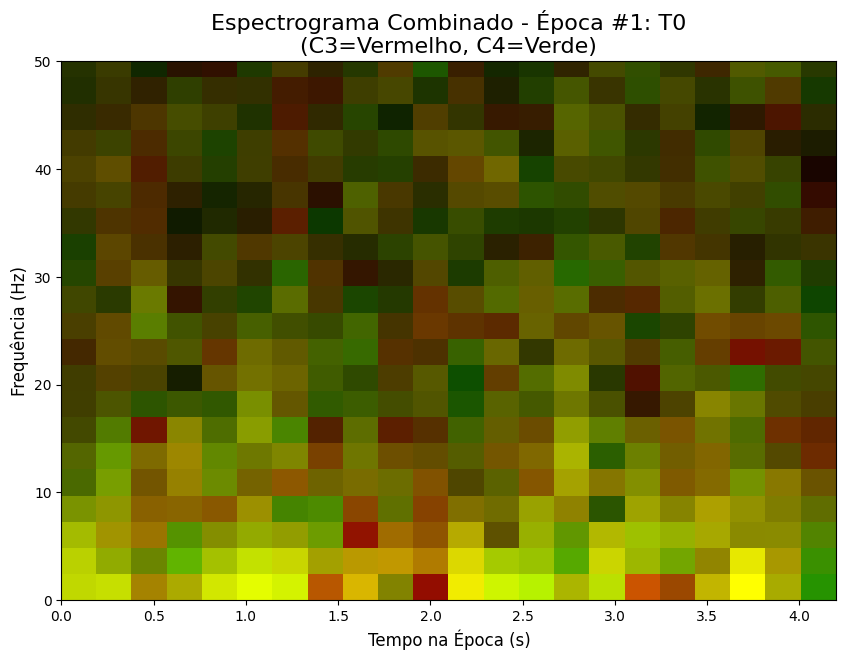

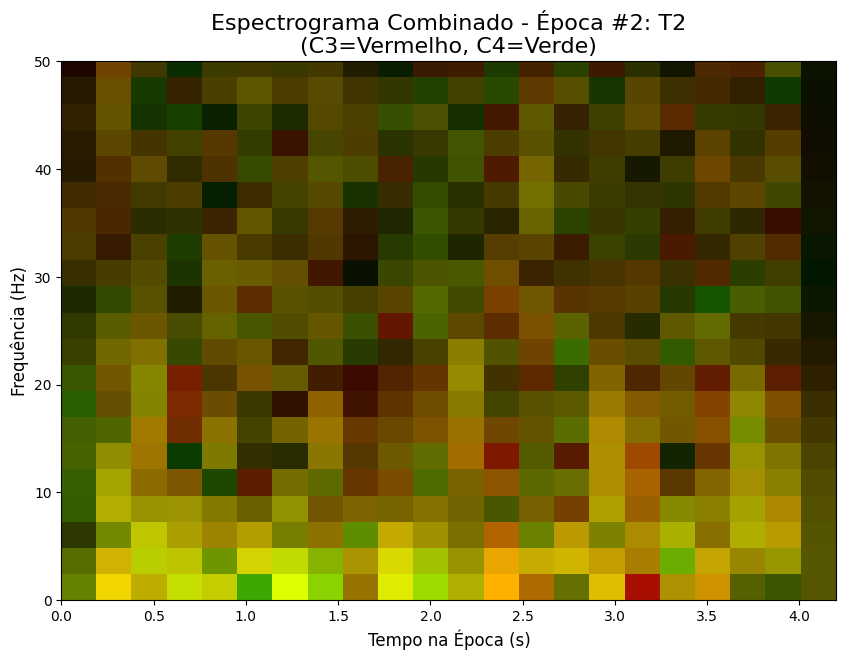

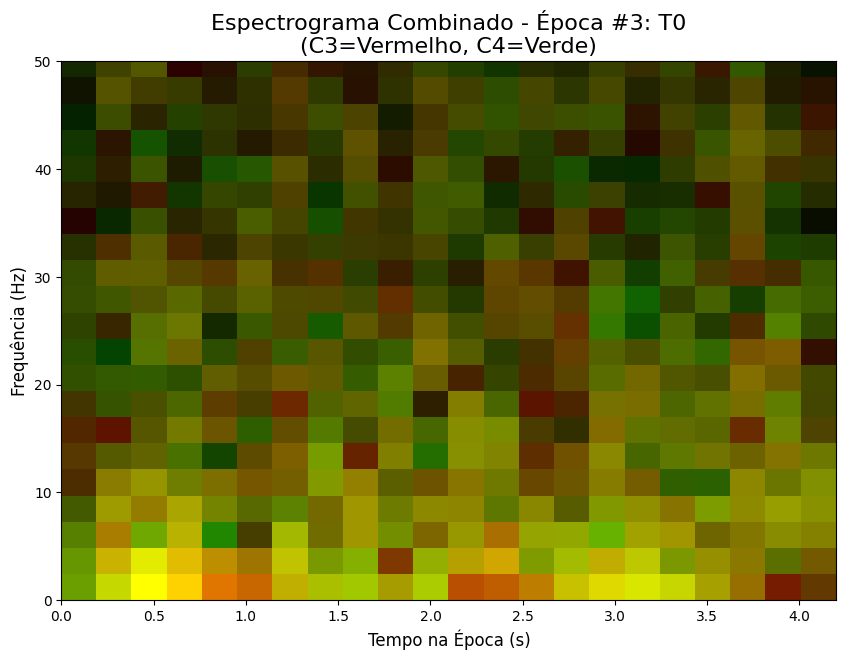

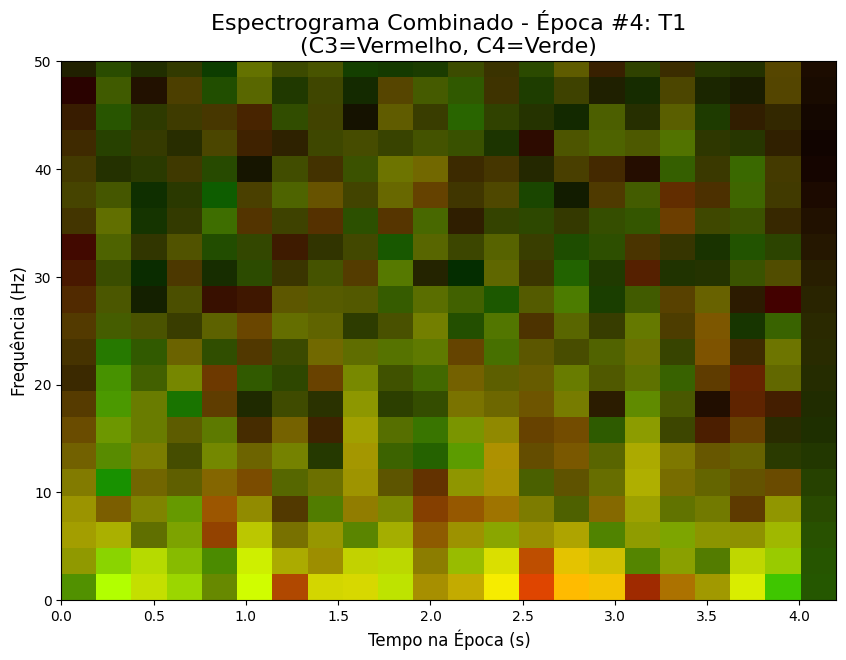

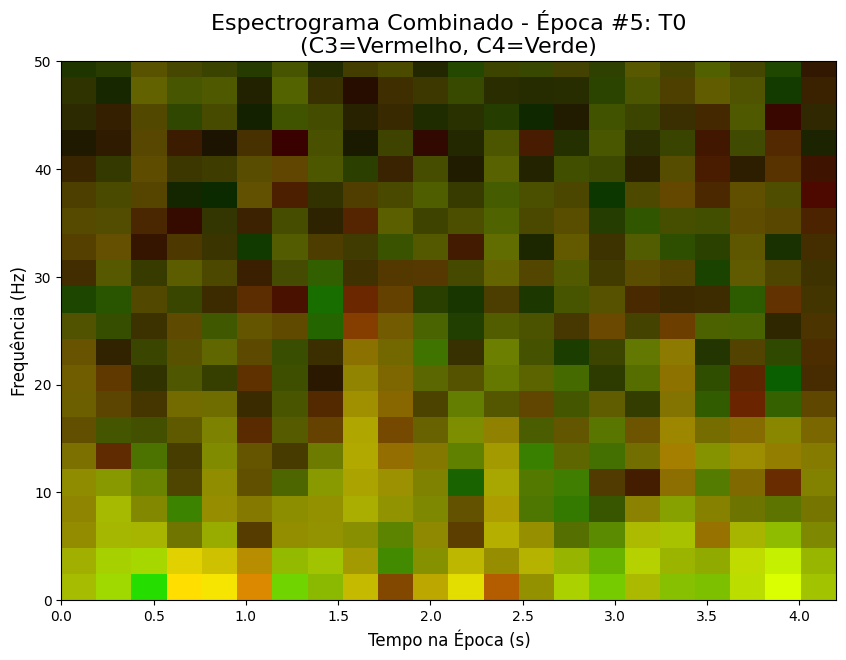

...

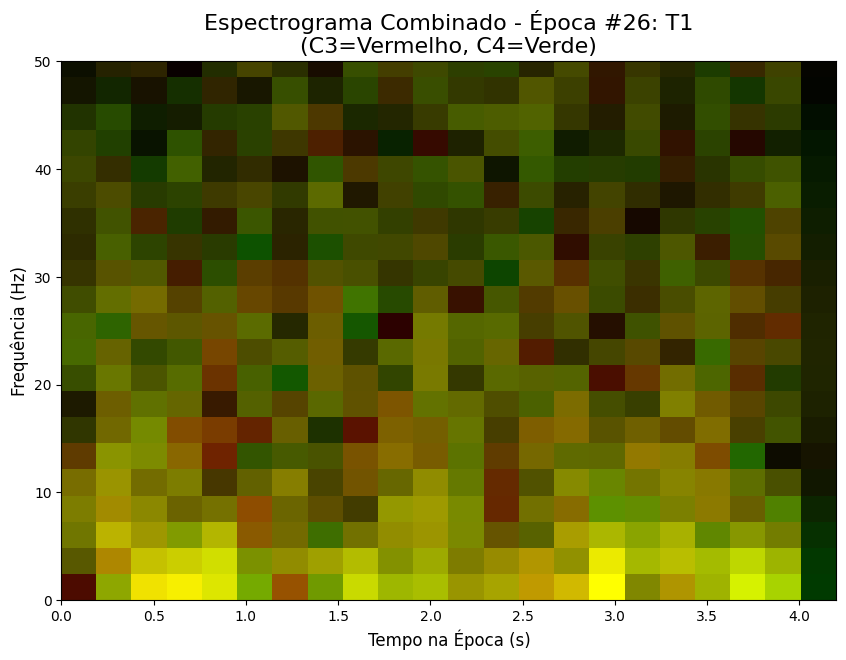

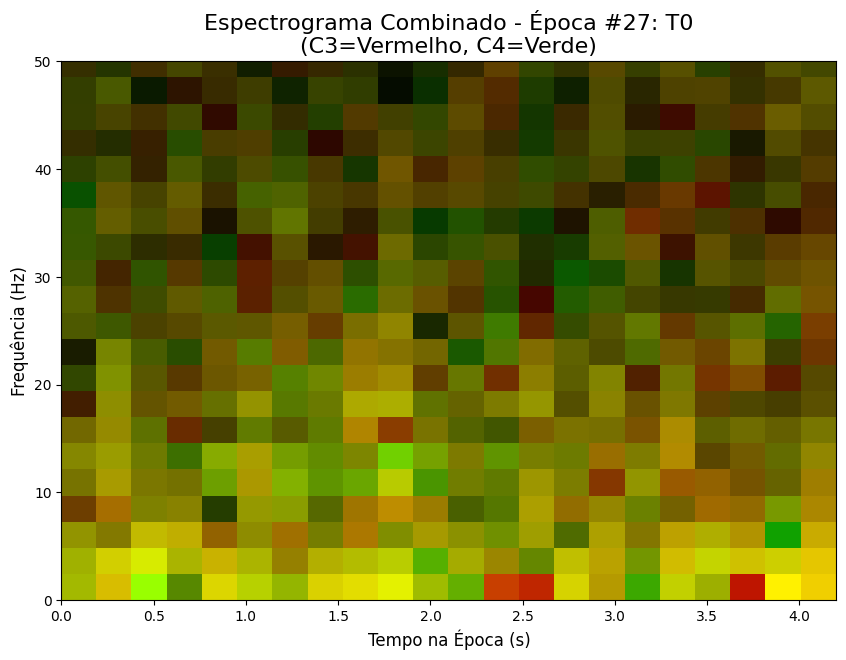

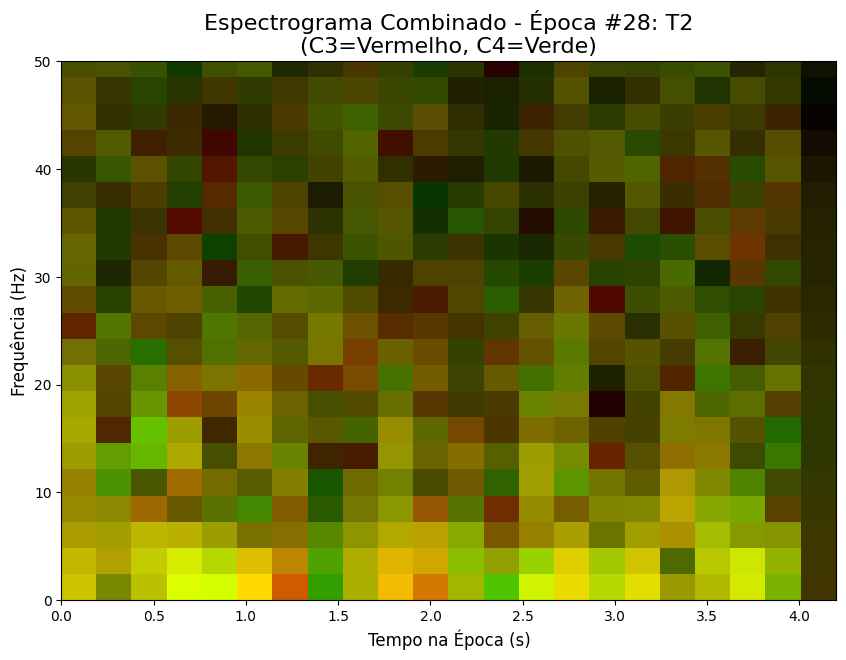

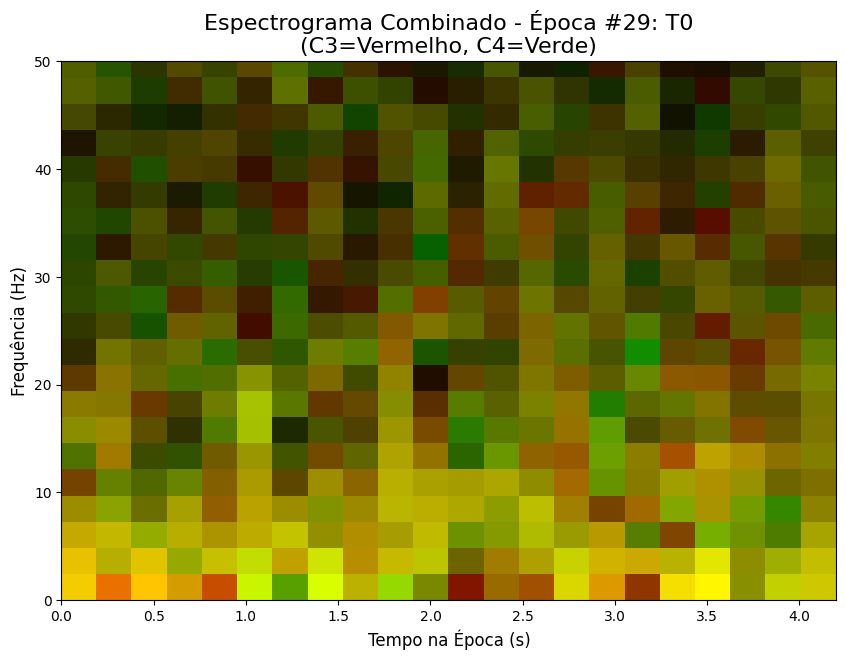

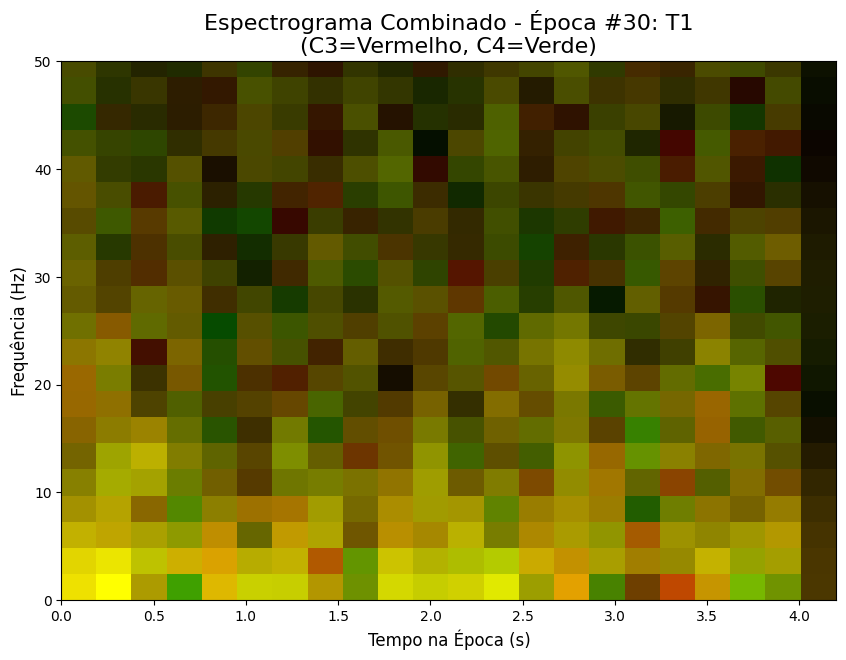


Todos os espectrogramas combinados foram gerados.


In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft
from pyedflib import highlevel
import cv2  # Importa a biblioteca OpenCV

# --- 1. Definição de Constantes e Parâmetros ---

FILE_PATH = os.path.join('data', 'physionet_data', 'S001', 'S001R03.edf')
WINDOW_DURATION_MS = 400  # Duração da janela em milissegundos
CHANNELS_TO_ANALYZE = ['C3..', 'C4..'] # Canais para análise conjunta

# --- 2. Carregamento e Preparação dos Dados ---

try:
    print(f"Carregando o arquivo: {FILE_PATH}")
    signals, signal_headers, header = highlevel.read_edf(FILE_PATH)
    annotations = header['annotations']
    fs = signal_headers[0]['sample_frequency']
    channel_names = [h['label'] for h in signal_headers]
    
    c3_idx = channel_names.index(CHANNELS_TO_ANALYZE[0])
    c4_idx = channel_names.index(CHANNELS_TO_ANALYZE[1])
    
    signal_c3 = signals[c3_idx, :]
    signal_c4 = signals[c4_idx, :]
    
    print(f"Dados carregados. Frequência de amostragem: {fs} Hz.")
    print(f"Total de {len(annotations)} anotações encontradas.")

except FileNotFoundError:
    print(f"ERRO: O arquivo não foi encontrado em '{FILE_PATH}'.")
    exit()
except Exception as e:
    print(f"Ocorreu um erro: {e}")
    exit()

# --- 3. Geração da Imagem Combinada por Época ---

window_duration_s = WINDOW_DURATION_MS / 1000.0
nperseg = int(window_duration_s * fs)
noverlap = nperseg // 2

print("\nIniciando a geração de espectrogramas combinados para cada época...")

for i, (onset, duration, description) in enumerate(annotations):
    
    start_sample = int(onset * fs)
    end_sample = int((onset + duration) * fs)
    
    if end_sample > len(signal_c3): continue
        
    epoch_c3 = signal_c3[start_sample:end_sample]
    epoch_c4 = signal_c4[start_sample:end_sample]
    
    f, t, Zxx_c3 = stft(epoch_c3, fs=fs, nperseg=nperseg, noverlap=noverlap)
    _, _, Zxx_c4 = stft(epoch_c4, fs=fs, nperseg=nperseg, noverlap=noverlap)
    
    # --- COMBINAÇÃO DOS ESPECTROGRAMAS EM IMAGEM ---
    
    # Pega a magnitude de cada espectrograma
    mag_c3 = np.abs(Zxx_c3)
    mag_c4 = np.abs(Zxx_c4)
    
    # Aplica escala logarítmica para comprimir a faixa de valores e melhorar a visualização
    log_c3 = np.log1p(mag_c3)
    log_c4 = np.log1p(mag_c4)

    # Normaliza cada canal para o intervalo de 0 a 255 (formato de imagem de 8 bits)
    norm_c3 = cv2.normalize(log_c3, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    norm_c4 = cv2.normalize(log_c4, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    
    # Cria um canal azul vazio (matriz de zeros)
    blue_channel = np.zeros_like(norm_c3)

    # Empilha os canais para formar uma imagem BGR (padrão do OpenCV)
    # C4 -> Verde, C3 -> Vermelho
    bgr_image = cv2.merge([blue_channel, norm_c4, norm_c3])
    
    # Converte de BGR para RGB para exibição correta com Matplotlib
    rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
    
    # --- PLOTAGEM DA IMAGEM COMBINADA ---
    plt.figure(figsize=(10, 7))
    
    # Usamos imshow para exibir a imagem, com o 'extent' para corrigir os eixos
    plt.imshow(rgb_image, aspect='auto', origin='lower', 
               extent=[t.min(), t.max(), f.min(), f.max()])
    
    plt.title(f'Espectrograma Combinado - Época #{i+1}: {description}\n(C3=Vermelho, C4=Verde)', fontsize=16)
    plt.ylabel('Frequência (Hz)', fontsize=12)
    plt.xlabel('Tempo na Época (s)', fontsize=12)
    plt.ylim(0, 50) # Foco nas bandas de EEG
    
    # Como não há uma escala única (são 3 canais), omitimos a colorbar
    
    plt.show()

print("\nTodos os espectrogramas combinados foram gerados.")